#  DCGAN - Bricks Data

In [24]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

# from utils import display, sample_batch

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("joosthazelzet/lego-brick-images")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/lego-brick-images


In [26]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [27]:
# List all GPUs
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the first GPU
        tf.config.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPUs")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPUs


## 0. Parameters <a name="parameters"></a>

In [28]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 100
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [29]:
train_data = utils.image_dataset_from_directory(
    "/kaggle/input/lego-brick-images",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 46384 files.


In [30]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [31]:

def sample_batch(dataset):
    batch = dataset.take(1).get_single_element()
    if isinstance(batch, tuple):
        batch = batch[0]
    return batch.numpy()


In [32]:
train_sample = sample_batch(train)

In [33]:
def display(
    images, n=10, size=(20, 3), cmap="gray_r", as_type="float32", save_to=None
):
    """
    Displays n random images from each one of the supplied arrays.
    """
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0
def display(
    images, n=10, size=(20, 3), cmap="gray_r", as_type="float32", save_to=None
):
    """
    Displays n random images from each one of the supplied arrays.
    """
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0

    plt.figure(figsize=size)
    for i in range(n):
        _ = plt.subplot(1, n, i + 1)
        plt.imshow(images[i].astype(as_type), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to)
        print(f"\nSaved to {save_to}")

    plt.show()

    plt.figure(figsize=size)
    for i in range(n):
        _ = plt.subplot(1, n, i + 1)
        plt.imshow(images[i].astype(as_type), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to)
        print(f"\nSaved to {save_to}")

    plt.show()


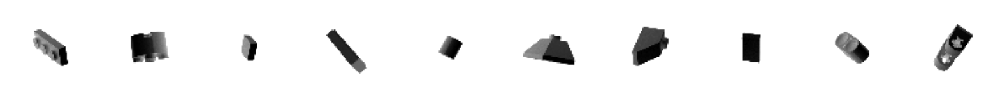

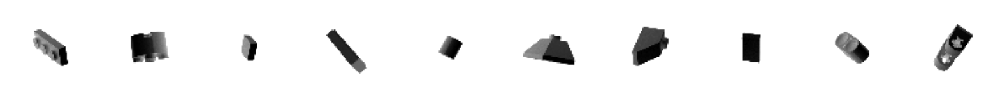

In [34]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [35]:
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 64)          │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 16, 16, 128)         │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_9 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 8, 8, 256)           │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_10 (LeakyReLU)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 4, 4, 512)           │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 4, 4, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_11 (LeakyReLU)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 1, 1, 1)             │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,765,312 (10.55 MB)

 Trainable params: 2,763,520 (10.54 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [36]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 1, 1, 100)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 4, 4, 512)           │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 4, 4, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_12 (LeakyReLU)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_6 (Conv2DTranspose) │ (None, 8, 8, 256)           │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_13 (LeakyReLU)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_7 (Conv2DTranspose) │ (None, 16, 16, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_14 (LeakyReLU)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_8 (Conv2DTranspose) │ (None, 32, 32, 64)          │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_15 (LeakyReLU)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_9 (Conv2DTranspose) │ (None, 64, 64, 1)           │           1,024 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,576,576 (13.64 MB)

 Trainable params: 3,574,656 (13.64 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [37]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            )
            real_predictions = self.discriminator(real_images, training=True)
            fake_predictions = self.discriminator(
                generated_images, training=True
            )

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [38]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [39]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [40]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [41]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.weights.h5",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="generated_img_%03d.png" % (epoch),
        )

Epoch 1/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - d_acc: 0.8638 - d_fake_acc: 0.8605 - d_loss: 0.1746 - d_real_acc: 0.8671 - g_acc: 0.1395 - g_loss: 5.0468
Saved to generated_img_000.png


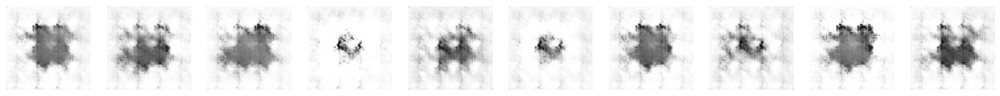


Saved to generated_img_000.png


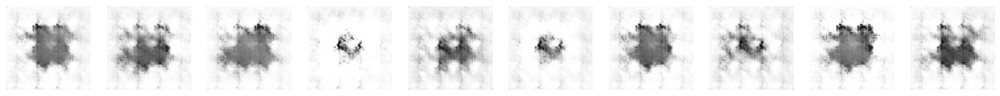

363/363 ━━━━━━━━━━━━━━━━━━━━ 66s 139ms/step - d_acc: 0.8638 - d_fake_acc: 0.8606 - d_loss: 0.1746 - d_real_acc: 0.8670 - g_acc: 0.1394 - g_loss: 5.0451
Epoch 2/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9127 - d_fake_acc: 0.9175 - d_loss: 0.0357 - d_real_acc: 0.9080 - g_acc: 0.0825 - g_loss: 5.1050
Saved to generated_img_001.png


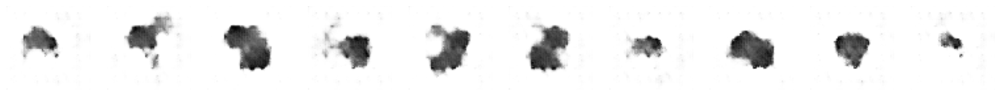


Saved to generated_img_001.png


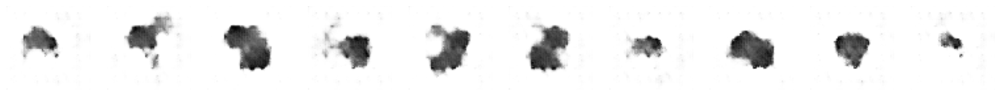

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9127 - d_fake_acc: 0.9174 - d_loss: 0.0359 - d_real_acc: 0.9079 - g_acc: 0.0826 - g_loss: 5.1058
Epoch 3/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.8755 - d_fake_acc: 0.8741 - d_loss: 0.1816 - d_real_acc: 0.8768 - g_acc: 0.1259 - g_loss: 4.8336
Saved to generated_img_002.png


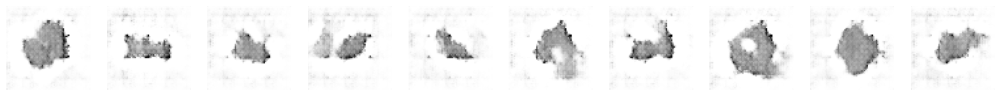


Saved to generated_img_002.png


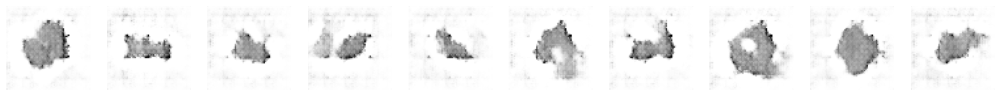

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.8756 - d_fake_acc: 0.8742 - d_loss: 0.1811 - d_real_acc: 0.8769 - g_acc: 0.1258 - g_loss: 4.8331
Epoch 4/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.8568 - d_fake_acc: 0.8587 - d_loss: 0.2384 - d_real_acc: 0.8550 - g_acc: 0.1413 - g_loss: 4.3031
Saved to generated_img_003.png


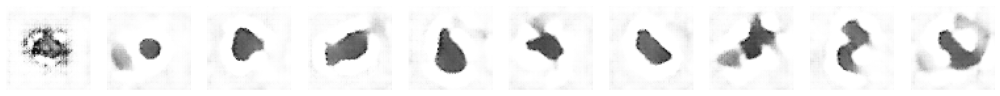


Saved to generated_img_003.png


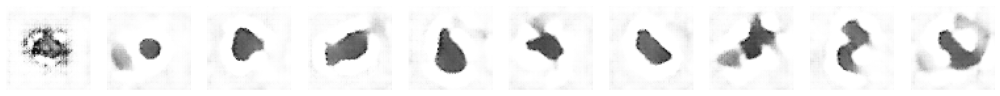

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.8569 - d_fake_acc: 0.8587 - d_loss: 0.2381 - d_real_acc: 0.8551 - g_acc: 0.1413 - g_loss: 4.3018
Epoch 5/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.8748 - d_fake_acc: 0.8747 - d_loss: 0.1338 - d_real_acc: 0.8749 - g_acc: 0.1253 - g_loss: 3.8719
Saved to generated_img_004.png


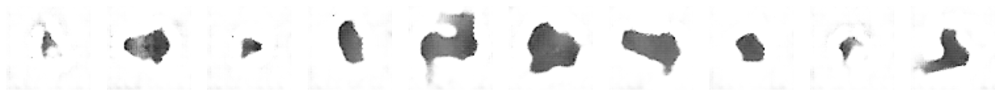


Saved to generated_img_004.png


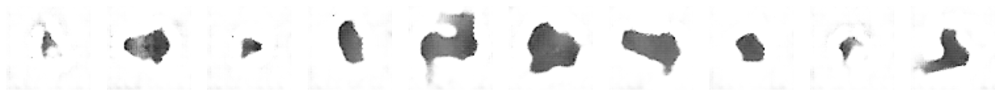

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - d_acc: 0.8748 - d_fake_acc: 0.8747 - d_loss: 0.1339 - d_real_acc: 0.8749 - g_acc: 0.1253 - g_loss: 3.8718
Epoch 6/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.8742 - d_fake_acc: 0.8720 - d_loss: 0.1390 - d_real_acc: 0.8764 - g_acc: 0.1280 - g_loss: 3.8307
Saved to generated_img_005.png


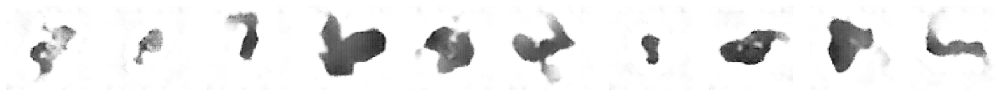


Saved to generated_img_005.png


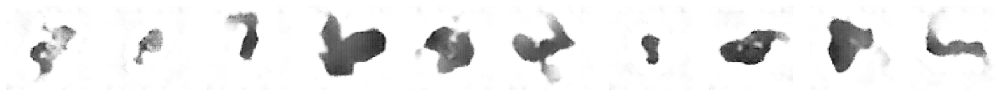

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.8742 - d_fake_acc: 0.8720 - d_loss: 0.1389 - d_real_acc: 0.8764 - g_acc: 0.1280 - g_loss: 3.8310
Epoch 7/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.8777 - d_fake_acc: 0.8828 - d_loss: 0.1368 - d_real_acc: 0.8727 - g_acc: 0.1172 - g_loss: 4.0946
Saved to generated_img_006.png


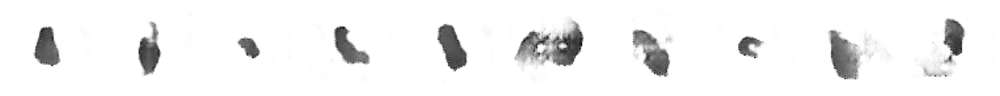


Saved to generated_img_006.png


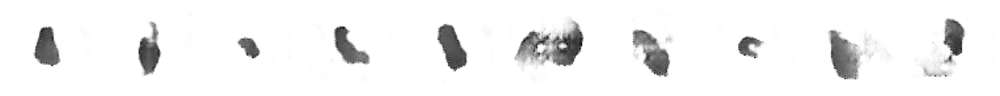

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.8778 - d_fake_acc: 0.8828 - d_loss: 0.1366 - d_real_acc: 0.8727 - g_acc: 0.1172 - g_loss: 4.0948
Epoch 8/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 0.8571 - d_fake_acc: 0.8530 - d_loss: 0.2242 - d_real_acc: 0.8613 - g_acc: 0.1470 - g_loss: 3.9305
Saved to generated_img_007.png


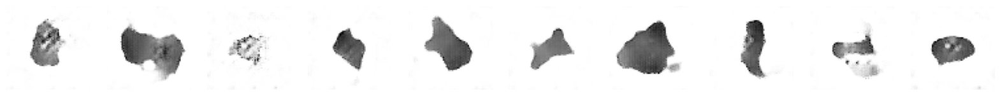


Saved to generated_img_007.png


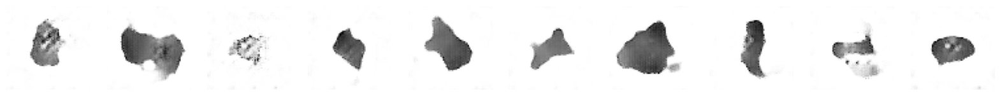

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.8572 - d_fake_acc: 0.8531 - d_loss: 0.2239 - d_real_acc: 0.8613 - g_acc: 0.1469 - g_loss: 3.9305
Epoch 9/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.8888 - d_fake_acc: 0.8897 - d_loss: 0.0871 - d_real_acc: 0.8880 - g_acc: 0.1103 - g_loss: 4.4009
Saved to generated_img_008.png


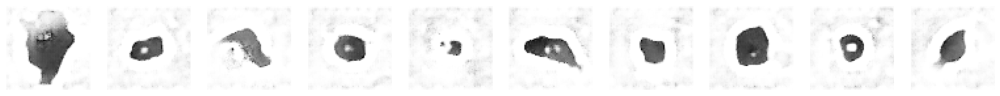


Saved to generated_img_008.png


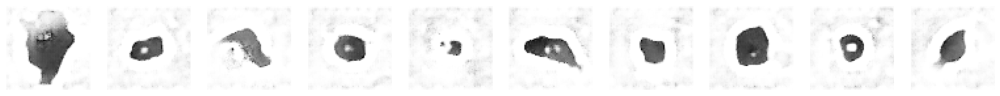

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.8888 - d_fake_acc: 0.8897 - d_loss: 0.0873 - d_real_acc: 0.8879 - g_acc: 0.1103 - g_loss: 4.4004
Epoch 10/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.8986 - d_fake_acc: 0.9008 - d_loss: 0.0842 - d_real_acc: 0.8964 - g_acc: 0.0992 - g_loss: 4.5890
Saved to generated_img_009.png


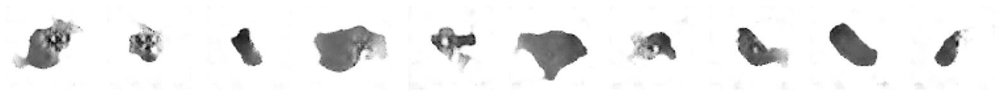


Saved to generated_img_009.png


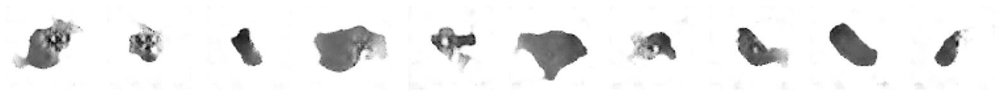

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.8986 - d_fake_acc: 0.9008 - d_loss: 0.0840 - d_real_acc: 0.8965 - g_acc: 0.0992 - g_loss: 4.5894
Epoch 11/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.8980 - d_fake_acc: 0.8997 - d_loss: 0.0696 - d_real_acc: 0.8963 - g_acc: 0.1003 - g_loss: 4.6579
Saved to generated_img_010.png


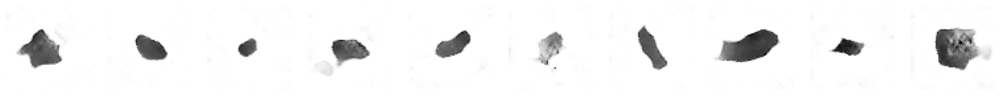


Saved to generated_img_010.png


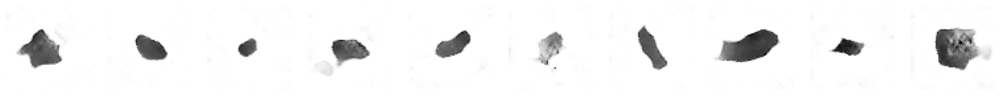

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.8980 - d_fake_acc: 0.8997 - d_loss: 0.0696 - d_real_acc: 0.8963 - g_acc: 0.1003 - g_loss: 4.6580
Epoch 12/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9226 - d_fake_acc: 0.9217 - d_loss: 4.5148e-04 - d_real_acc: 0.9234 - g_acc: 0.0783 - g_loss: 5.1516
Saved to generated_img_011.png


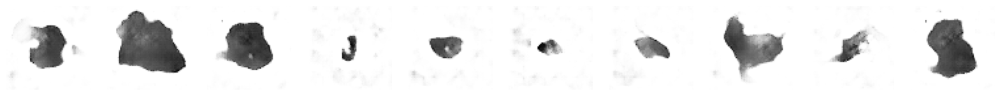


Saved to generated_img_011.png


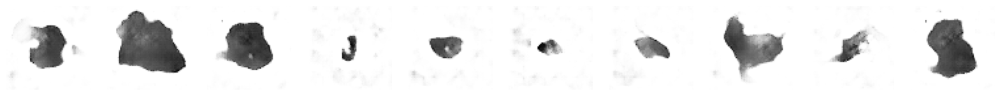

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9225 - d_fake_acc: 0.9217 - d_loss: 5.8339e-04 - d_real_acc: 0.9234 - g_acc: 0.0783 - g_loss: 5.1509
Epoch 13/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9171 - d_fake_acc: 0.9174 - d_loss: 0.0527 - d_real_acc: 0.9168 - g_acc: 0.0826 - g_loss: 5.2614
Saved to generated_img_012.png


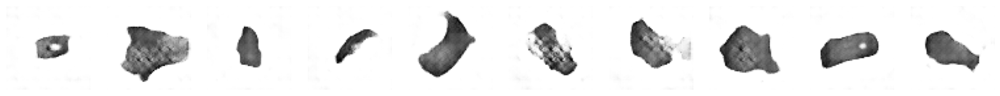


Saved to generated_img_012.png


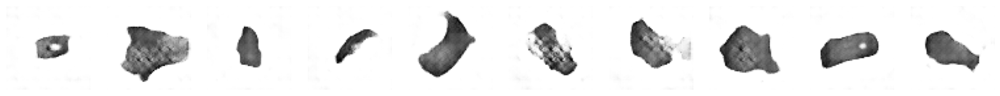

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9171 - d_fake_acc: 0.9174 - d_loss: 0.0526 - d_real_acc: 0.9168 - g_acc: 0.0826 - g_loss: 5.2618
Epoch 14/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 0.9364 - d_fake_acc: 0.9395 - d_loss: -0.0838 - d_real_acc: 0.9334 - g_acc: 0.0605 - g_loss: 5.4094
Saved to generated_img_013.png


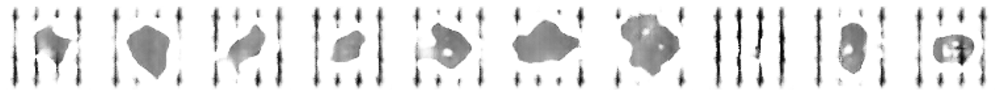


Saved to generated_img_013.png


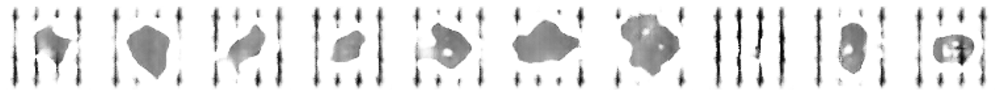

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - d_acc: 0.9365 - d_fake_acc: 0.9396 - d_loss: -0.0840 - d_real_acc: 0.9334 - g_acc: 0.0604 - g_loss: 5.4124
Epoch 15/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9560 - d_fake_acc: 0.9570 - d_loss: -0.1827 - d_real_acc: 0.9550 - g_acc: 0.0430 - g_loss: 6.8569
Saved to generated_img_014.png


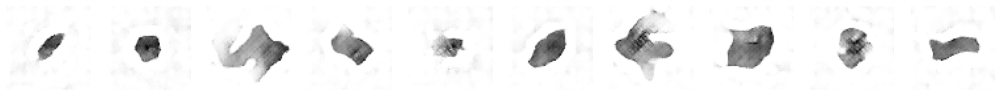


Saved to generated_img_014.png


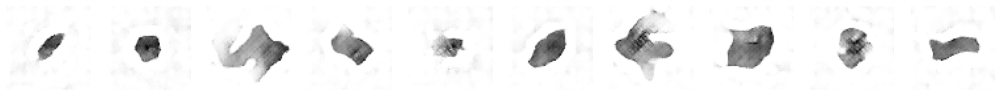

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9558 - d_fake_acc: 0.9569 - d_loss: -0.1817 - d_real_acc: 0.9548 - g_acc: 0.0431 - g_loss: 6.8524
Epoch 16/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9290 - d_fake_acc: 0.9340 - d_loss: -0.0432 - d_real_acc: 0.9239 - g_acc: 0.0660 - g_loss: 5.6448
Saved to generated_img_015.png


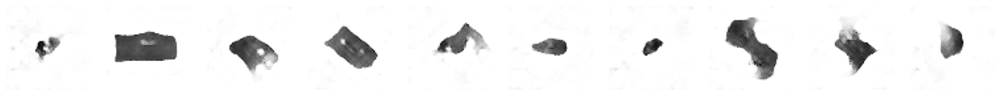


Saved to generated_img_015.png


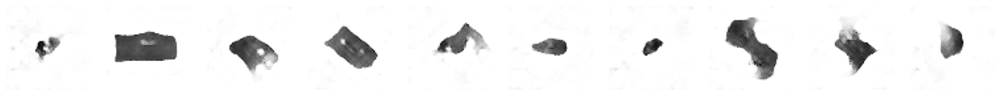

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9290 - d_fake_acc: 0.9340 - d_loss: -0.0435 - d_real_acc: 0.9240 - g_acc: 0.0660 - g_loss: 5.6462
Epoch 17/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.8837 - d_fake_acc: 0.8849 - d_loss: 0.1550 - d_real_acc: 0.8825 - g_acc: 0.1151 - g_loss: 5.5863
Saved to generated_img_016.png


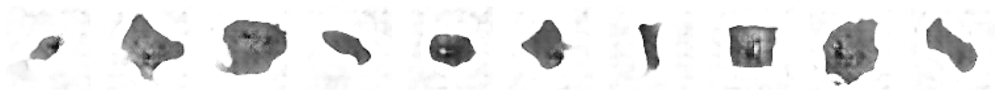


Saved to generated_img_016.png


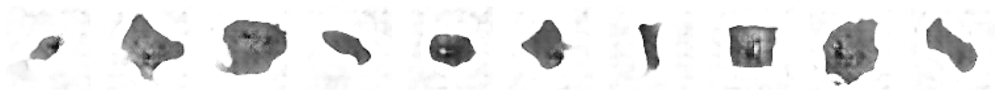

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.8838 - d_fake_acc: 0.8850 - d_loss: 0.1547 - d_real_acc: 0.8826 - g_acc: 0.1150 - g_loss: 5.5868
Epoch 18/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9297 - d_fake_acc: 0.9306 - d_loss: -0.0554 - d_real_acc: 0.9288 - g_acc: 0.0694 - g_loss: 5.7581
Saved to generated_img_017.png


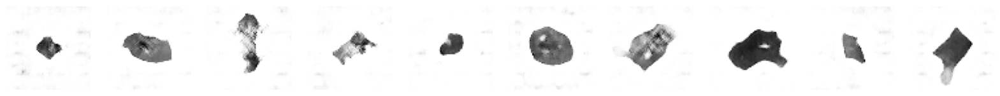


Saved to generated_img_017.png


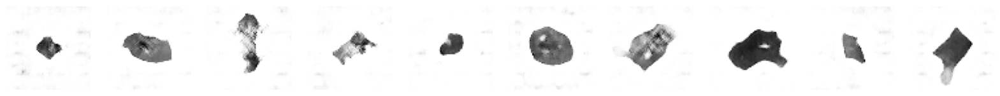

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9297 - d_fake_acc: 0.9306 - d_loss: -0.0553 - d_real_acc: 0.9288 - g_acc: 0.0694 - g_loss: 5.7586
Epoch 19/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9239 - d_fake_acc: 0.9211 - d_loss: 0.0136 - d_real_acc: 0.9267 - g_acc: 0.0789 - g_loss: 6.4192
Saved to generated_img_018.png


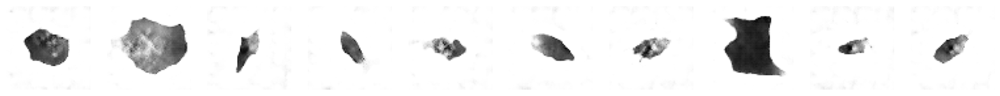


Saved to generated_img_018.png


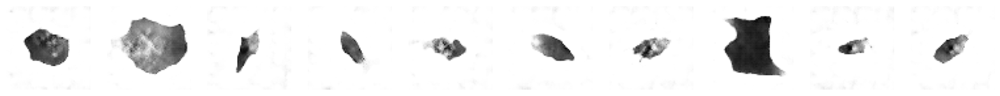

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9239 - d_fake_acc: 0.9212 - d_loss: 0.0135 - d_real_acc: 0.9267 - g_acc: 0.0788 - g_loss: 6.4187
Epoch 20/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9434 - d_fake_acc: 0.9451 - d_loss: -0.1281 - d_real_acc: 0.9416 - g_acc: 0.0549 - g_loss: 6.5956
Saved to generated_img_019.png


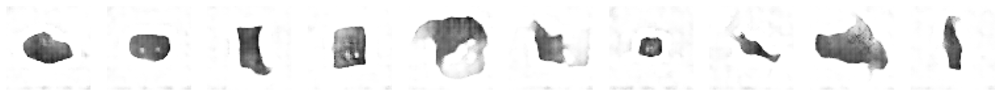


Saved to generated_img_019.png


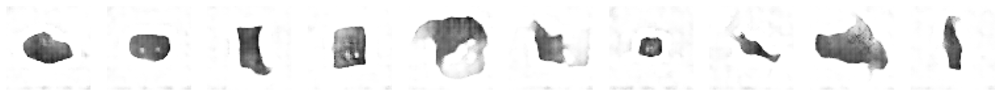

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9433 - d_fake_acc: 0.9450 - d_loss: -0.1277 - d_real_acc: 0.9416 - g_acc: 0.0550 - g_loss: 6.5944
Epoch 21/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9244 - d_fake_acc: 0.9296 - d_loss: 0.0704 - d_real_acc: 0.9192 - g_acc: 0.0704 - g_loss: 6.2142
Saved to generated_img_020.png


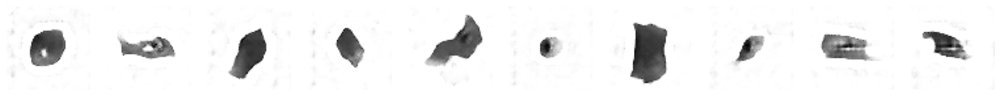


Saved to generated_img_020.png


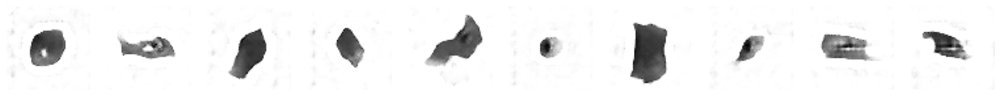

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.9244 - d_fake_acc: 0.9296 - d_loss: 0.0707 - d_real_acc: 0.9191 - g_acc: 0.0704 - g_loss: 6.2135
Epoch 22/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9251 - d_fake_acc: 0.9283 - d_loss: -0.0333 - d_real_acc: 0.9219 - g_acc: 0.0717 - g_loss: 6.5476
Saved to generated_img_021.png


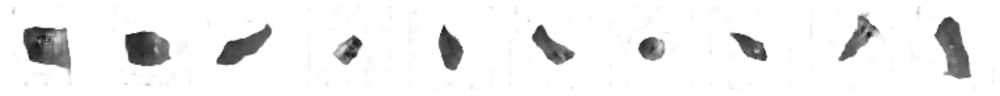


Saved to generated_img_021.png


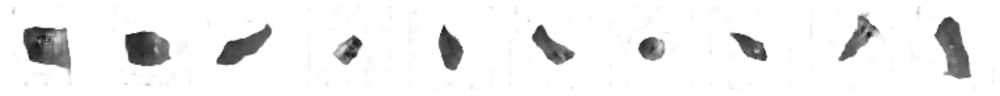

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9252 - d_fake_acc: 0.9284 - d_loss: -0.0338 - d_real_acc: 0.9221 - g_acc: 0.0716 - g_loss: 6.5489
Epoch 23/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9282 - d_fake_acc: 0.9285 - d_loss: -0.0596 - d_real_acc: 0.9279 - g_acc: 0.0715 - g_loss: 6.8447
Saved to generated_img_022.png


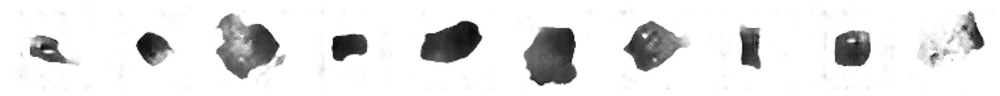


Saved to generated_img_022.png


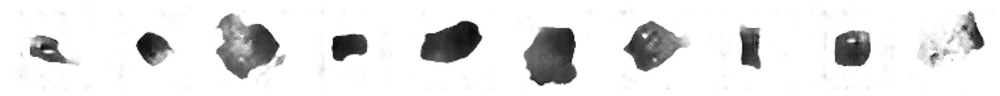

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9282 - d_fake_acc: 0.9285 - d_loss: -0.0597 - d_real_acc: 0.9280 - g_acc: 0.0715 - g_loss: 6.8445
Epoch 24/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.8905 - d_fake_acc: 0.8858 - d_loss: 0.1187 - d_real_acc: 0.8951 - g_acc: 0.1142 - g_loss: 5.8387
Saved to generated_img_023.png


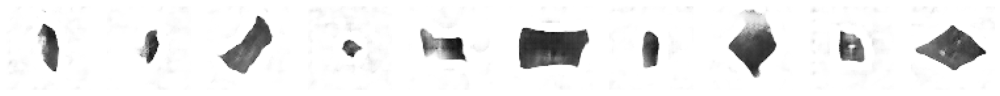


Saved to generated_img_023.png


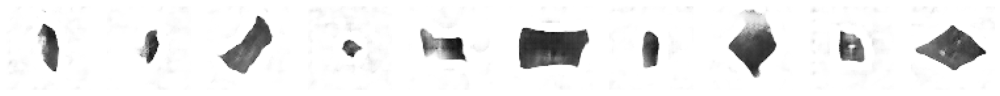

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.8907 - d_fake_acc: 0.8861 - d_loss: 0.1177 - d_real_acc: 0.8953 - g_acc: 0.1139 - g_loss: 5.8419
Epoch 25/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 0.9220 - d_fake_acc: 0.9200 - d_loss: 0.0306 - d_real_acc: 0.9240 - g_acc: 0.0800 - g_loss: 6.9781
Saved to generated_img_024.png


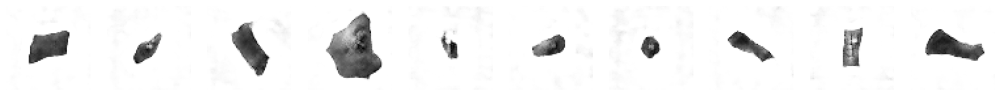


Saved to generated_img_024.png


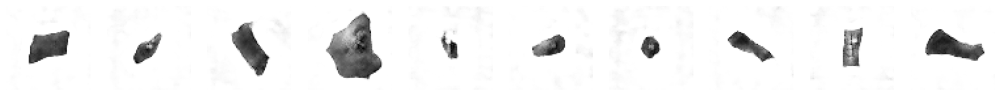

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9220 - d_fake_acc: 0.9201 - d_loss: 0.0303 - d_real_acc: 0.9240 - g_acc: 0.0799 - g_loss: 6.9781
Epoch 26/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9366 - d_fake_acc: 0.9372 - d_loss: -0.0888 - d_real_acc: 0.9360 - g_acc: 0.0628 - g_loss: 6.6254
Saved to generated_img_025.png


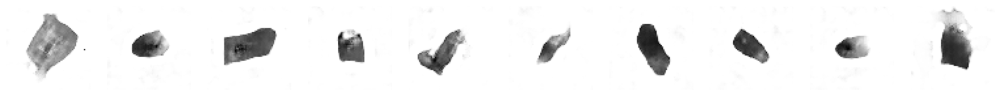


Saved to generated_img_025.png


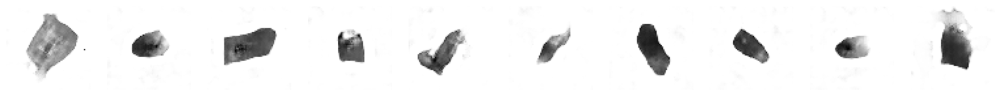

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - d_acc: 0.9366 - d_fake_acc: 0.9373 - d_loss: -0.0886 - d_real_acc: 0.9360 - g_acc: 0.0627 - g_loss: 6.6277
Epoch 27/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9464 - d_fake_acc: 0.9481 - d_loss: -0.1404 - d_real_acc: 0.9447 - g_acc: 0.0519 - g_loss: 7.7432
Saved to generated_img_026.png


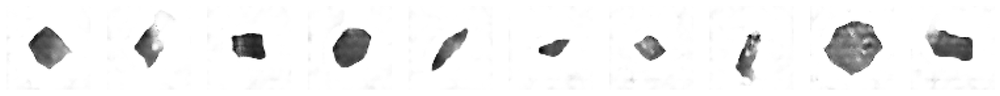


Saved to generated_img_026.png


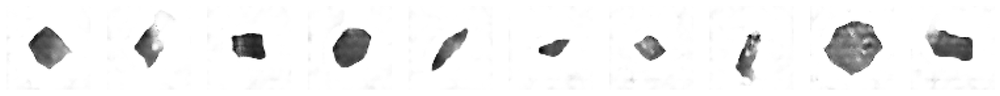

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9464 - d_fake_acc: 0.9481 - d_loss: -0.1403 - d_real_acc: 0.9447 - g_acc: 0.0519 - g_loss: 7.7423
Epoch 28/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9538 - d_fake_acc: 0.9551 - d_loss: -0.1818 - d_real_acc: 0.9525 - g_acc: 0.0449 - g_loss: 7.8941
Saved to generated_img_027.png


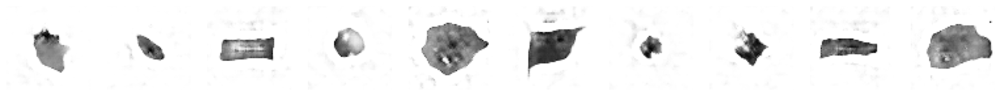


Saved to generated_img_027.png


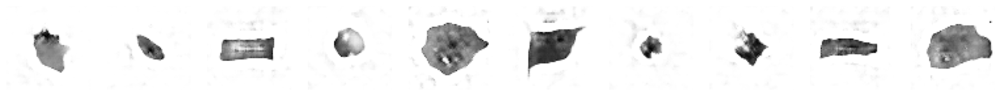

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9537 - d_fake_acc: 0.9551 - d_loss: -0.1814 - d_real_acc: 0.9524 - g_acc: 0.0449 - g_loss: 7.8939
Epoch 29/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9275 - d_fake_acc: 0.9292 - d_loss: -0.1079 - d_real_acc: 0.9258 - g_acc: 0.0708 - g_loss: 7.4741
Saved to generated_img_028.png


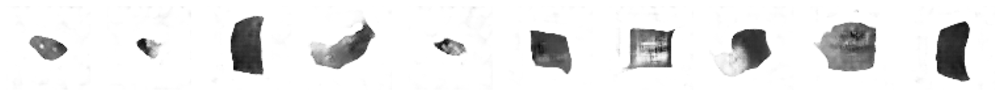


Saved to generated_img_028.png


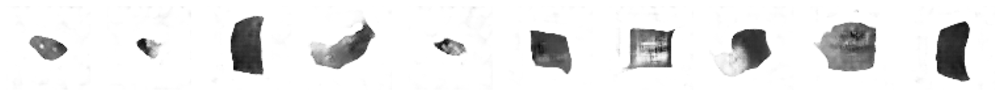

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9275 - d_fake_acc: 0.9292 - d_loss: -0.1082 - d_real_acc: 0.9258 - g_acc: 0.0708 - g_loss: 7.4760
Epoch 30/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9574 - d_fake_acc: 0.9581 - d_loss: -0.2734 - d_real_acc: 0.9566 - g_acc: 0.0419 - g_loss: 8.6381
Saved to generated_img_029.png


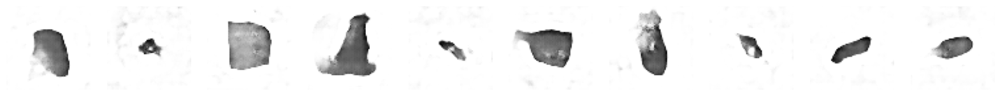


Saved to generated_img_029.png


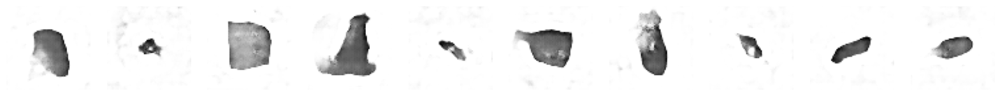

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.9573 - d_fake_acc: 0.9581 - d_loss: -0.2727 - d_real_acc: 0.9565 - g_acc: 0.0419 - g_loss: 8.6376
Epoch 31/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9485 - d_fake_acc: 0.9480 - d_loss: -0.2098 - d_real_acc: 0.9489 - g_acc: 0.0520 - g_loss: 8.1955
Saved to generated_img_030.png


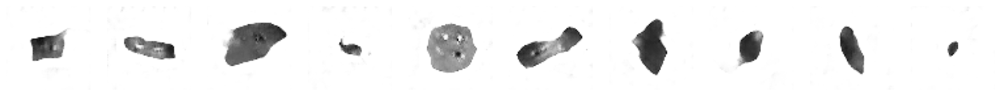


Saved to generated_img_030.png


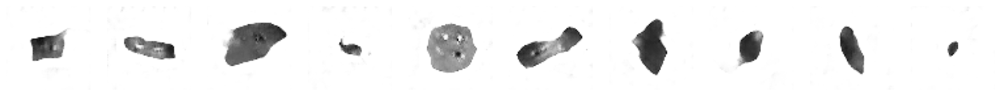

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9484 - d_fake_acc: 0.9480 - d_loss: -0.2096 - d_real_acc: 0.9489 - g_acc: 0.0520 - g_loss: 8.1945
Epoch 32/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9444 - d_fake_acc: 0.9486 - d_loss: -0.1213 - d_real_acc: 0.9402 - g_acc: 0.0514 - g_loss: 8.7920
Saved to generated_img_031.png


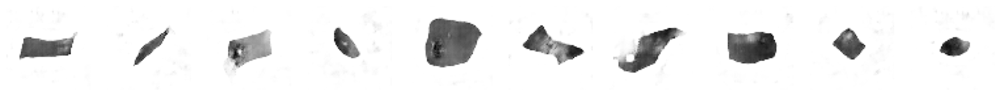


Saved to generated_img_031.png


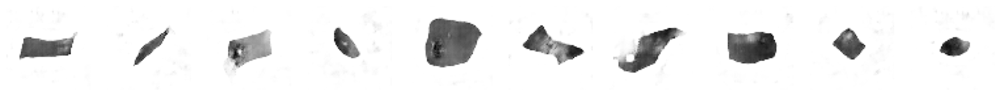

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.9443 - d_fake_acc: 0.9485 - d_loss: -0.1212 - d_real_acc: 0.9401 - g_acc: 0.0515 - g_loss: 8.7892
Epoch 33/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9653 - d_fake_acc: 0.9655 - d_loss: -0.3482 - d_real_acc: 0.9651 - g_acc: 0.0345 - g_loss: 9.6650
Saved to generated_img_032.png


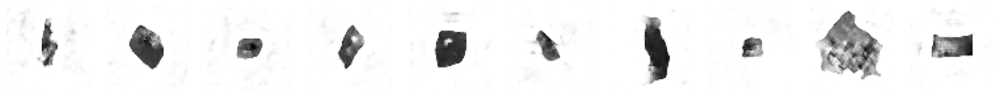


Saved to generated_img_032.png


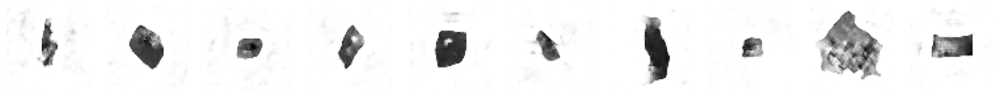

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9653 - d_fake_acc: 0.9655 - d_loss: -0.3480 - d_real_acc: 0.9651 - g_acc: 0.0345 - g_loss: 9.6643
Epoch 34/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 0.9036 - d_fake_acc: 0.8994 - d_loss: 0.0290 - d_real_acc: 0.9078 - g_acc: 0.1006 - g_loss: 7.4561
Saved to generated_img_033.png


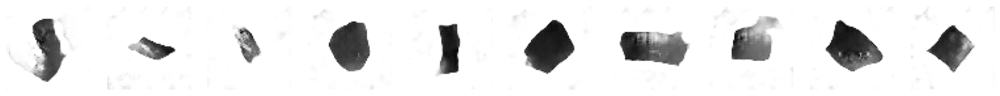


Saved to generated_img_033.png


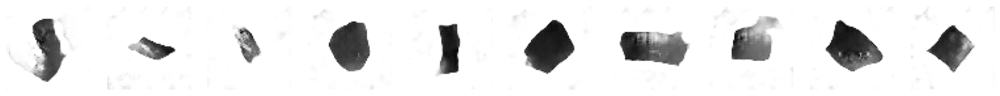

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - d_acc: 0.9037 - d_fake_acc: 0.8995 - d_loss: 0.0284 - d_real_acc: 0.9079 - g_acc: 0.1005 - g_loss: 7.4585
Epoch 35/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9614 - d_fake_acc: 0.9608 - d_loss: -0.3252 - d_real_acc: 0.9620 - g_acc: 0.0392 - g_loss: 9.7600
Saved to generated_img_034.png


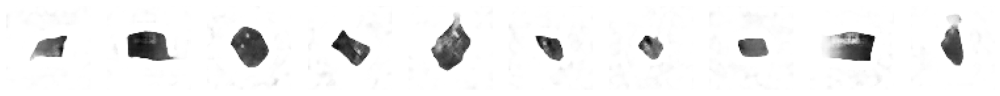


Saved to generated_img_034.png


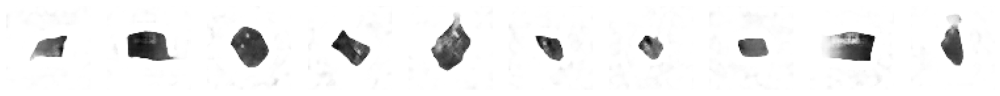

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.9613 - d_fake_acc: 0.9608 - d_loss: -0.3251 - d_real_acc: 0.9619 - g_acc: 0.0392 - g_loss: 9.7600
Epoch 36/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9522 - d_fake_acc: 0.9532 - d_loss: -0.3040 - d_real_acc: 0.9512 - g_acc: 0.0468 - g_loss: 9.5665
Saved to generated_img_035.png


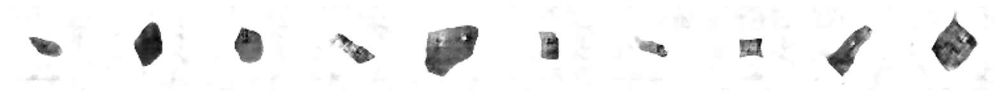


Saved to generated_img_035.png


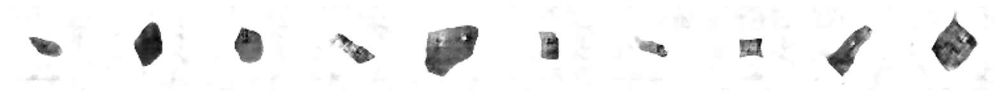

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9522 - d_fake_acc: 0.9532 - d_loss: -0.3039 - d_real_acc: 0.9513 - g_acc: 0.0468 - g_loss: 9.5668
Epoch 37/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9534 - d_fake_acc: 0.9562 - d_loss: -0.2374 - d_real_acc: 0.9506 - g_acc: 0.0438 - g_loss: 9.7277
Saved to generated_img_036.png


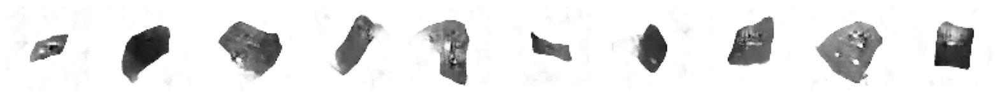


Saved to generated_img_036.png


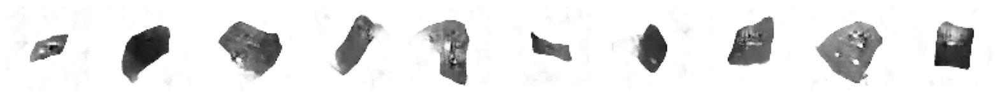

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9533 - d_fake_acc: 0.9561 - d_loss: -0.2368 - d_real_acc: 0.9505 - g_acc: 0.0439 - g_loss: 9.7249
Epoch 38/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_acc: 0.9509 - d_fake_acc: 0.9518 - d_loss: -0.3103 - d_real_acc: 0.9501 - g_acc: 0.0482 - g_loss: 9.8867
Saved to generated_img_037.png


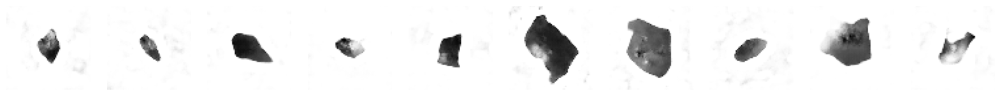


Saved to generated_img_037.png


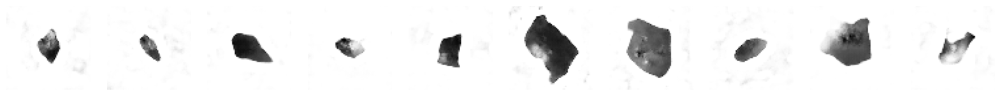

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9510 - d_fake_acc: 0.9518 - d_loss: -0.3106 - d_real_acc: 0.9501 - g_acc: 0.0482 - g_loss: 9.8911
Epoch 39/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9562 - d_fake_acc: 0.9543 - d_loss: -0.2978 - d_real_acc: 0.9580 - g_acc: 0.0457 - g_loss: 9.7646
Saved to generated_img_038.png


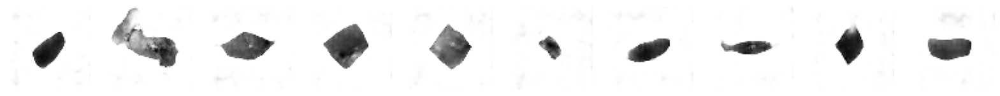


Saved to generated_img_038.png


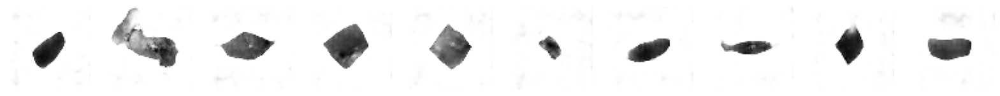

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.9562 - d_fake_acc: 0.9543 - d_loss: -0.2978 - d_real_acc: 0.9580 - g_acc: 0.0457 - g_loss: 9.7662
Epoch 40/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9622 - d_fake_acc: 0.9620 - d_loss: -0.3652 - d_real_acc: 0.9623 - g_acc: 0.0380 - g_loss: 10.1635
Saved to generated_img_039.png


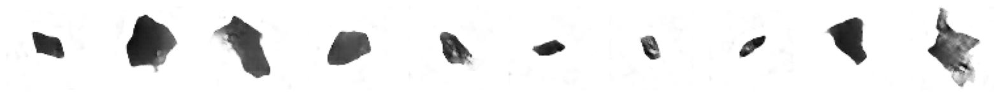


Saved to generated_img_039.png


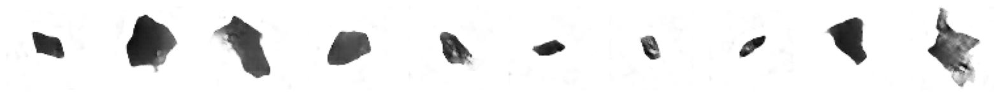

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9622 - d_fake_acc: 0.9620 - d_loss: -0.3653 - d_real_acc: 0.9623 - g_acc: 0.0380 - g_loss: 10.1688
Epoch 41/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9516 - d_fake_acc: 0.9539 - d_loss: -0.2770 - d_real_acc: 0.9494 - g_acc: 0.0461 - g_loss: 9.1451
Saved to generated_img_040.png


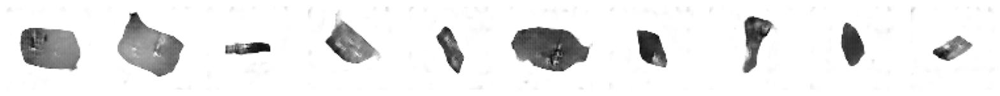


Saved to generated_img_040.png


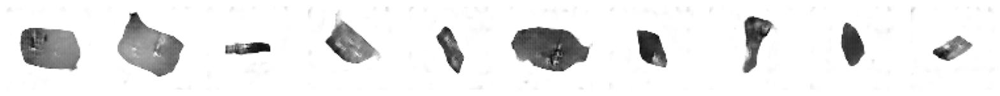

363/363 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - d_acc: 0.9517 - d_fake_acc: 0.9539 - d_loss: -0.2774 - d_real_acc: 0.9495 - g_acc: 0.0461 - g_loss: 9.1501
Epoch 42/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9742 - d_fake_acc: 0.9746 - d_loss: -0.5104 - d_real_acc: 0.9737 - g_acc: 0.0254 - g_loss: 12.2547
Saved to generated_img_041.png


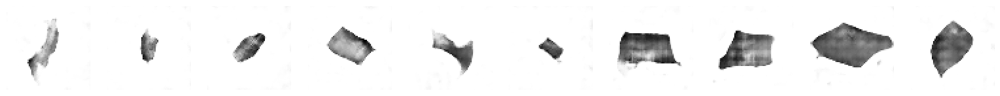


Saved to generated_img_041.png


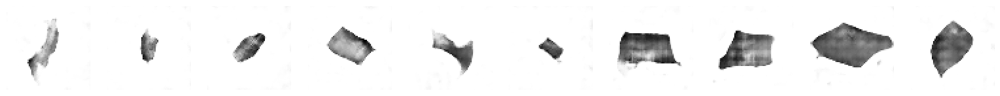

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9741 - d_fake_acc: 0.9746 - d_loss: -0.5099 - d_real_acc: 0.9737 - g_acc: 0.0254 - g_loss: 12.2511
Epoch 43/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9415 - d_fake_acc: 0.9426 - d_loss: -0.2504 - d_real_acc: 0.9404 - g_acc: 0.0574 - g_loss: 10.1553
Saved to generated_img_042.png


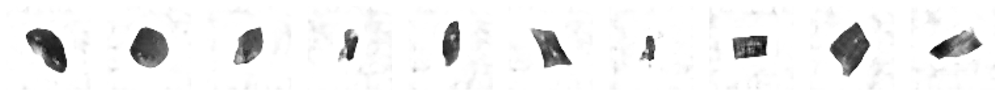


Saved to generated_img_042.png


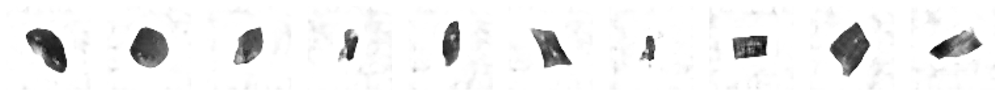

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9416 - d_fake_acc: 0.9427 - d_loss: -0.2509 - d_real_acc: 0.9405 - g_acc: 0.0573 - g_loss: 10.1559
Epoch 44/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9027 - d_fake_acc: 0.9182 - d_loss: 0.3223 - d_real_acc: 0.8873 - g_acc: 0.0818 - g_loss: 9.7141
Saved to generated_img_043.png


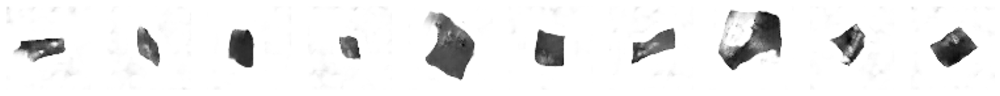


Saved to generated_img_043.png


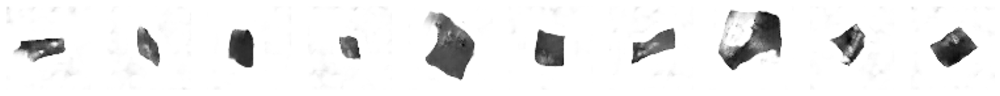

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9029 - d_fake_acc: 0.9183 - d_loss: 0.3209 - d_real_acc: 0.8875 - g_acc: 0.0817 - g_loss: 9.7143
Epoch 45/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9532 - d_fake_acc: 0.9549 - d_loss: -0.3007 - d_real_acc: 0.9516 - g_acc: 0.0451 - g_loss: 10.2631
Saved to generated_img_044.png


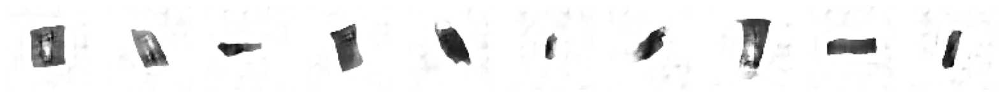


Saved to generated_img_044.png


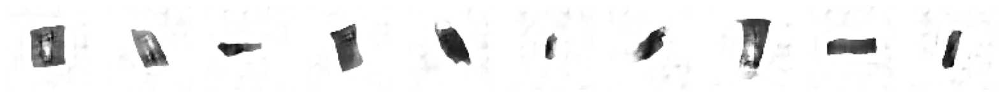

363/363 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - d_acc: 0.9532 - d_fake_acc: 0.9549 - d_loss: -0.3006 - d_real_acc: 0.9515 - g_acc: 0.0451 - g_loss: 10.2616
Epoch 46/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9283 - d_fake_acc: 0.9001 - d_loss: 0.1704 - d_real_acc: 0.9565 - g_acc: 0.0999 - g_loss: 10.0006
Saved to generated_img_045.png


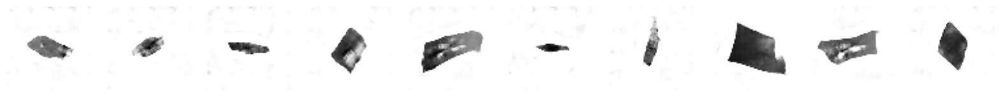


Saved to generated_img_045.png


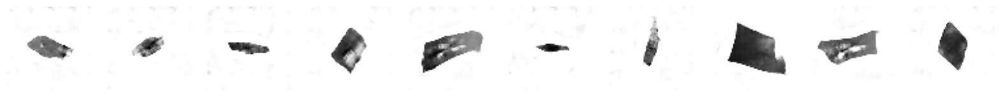

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.9284 - d_fake_acc: 0.9002 - d_loss: 0.1701 - d_real_acc: 0.9565 - g_acc: 0.0998 - g_loss: 10.0017
Epoch 47/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9002 - d_fake_acc: 0.9367 - d_loss: 0.4202 - d_real_acc: 0.8637 - g_acc: 0.0633 - g_loss: 10.7408
Saved to generated_img_046.png


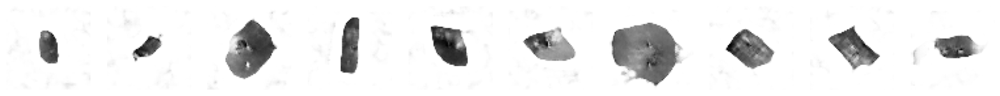


Saved to generated_img_046.png


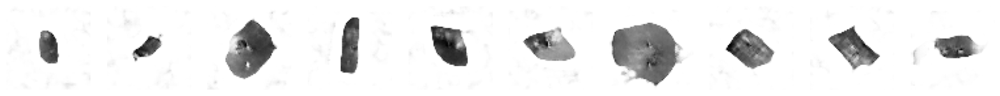

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9000 - d_fake_acc: 0.9366 - d_loss: 0.4224 - d_real_acc: 0.8635 - g_acc: 0.0634 - g_loss: 10.7360
Epoch 48/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9586 - d_fake_acc: 0.9603 - d_loss: -0.3045 - d_real_acc: 0.9569 - g_acc: 0.0397 - g_loss: 10.3321
Saved to generated_img_047.png


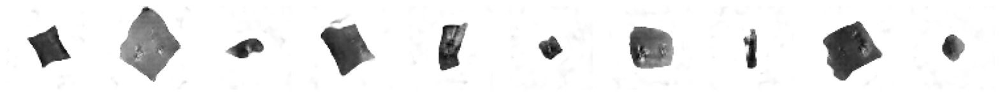


Saved to generated_img_047.png


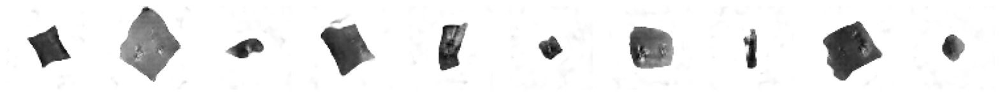

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.9585 - d_fake_acc: 0.9603 - d_loss: -0.3037 - d_real_acc: 0.9568 - g_acc: 0.0397 - g_loss: 10.3295
Epoch 49/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.9121 - d_fake_acc: 0.9074 - d_loss: 0.1216 - d_real_acc: 0.9169 - g_acc: 0.0926 - g_loss: 9.0608
Saved to generated_img_048.png


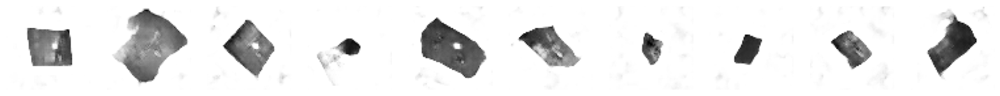


Saved to generated_img_048.png


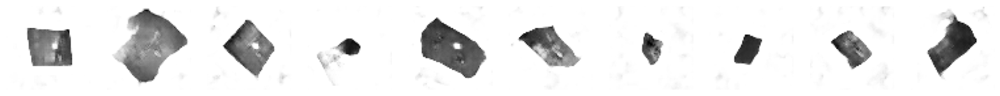

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9123 - d_fake_acc: 0.9076 - d_loss: 0.1195 - d_real_acc: 0.9171 - g_acc: 0.0924 - g_loss: 9.0669
Epoch 50/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9581 - d_fake_acc: 0.9605 - d_loss: -0.3547 - d_real_acc: 0.9556 - g_acc: 0.0395 - g_loss: 10.5985
Saved to generated_img_049.png


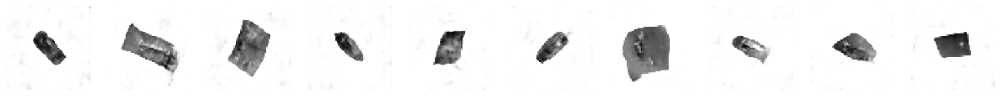


Saved to generated_img_049.png


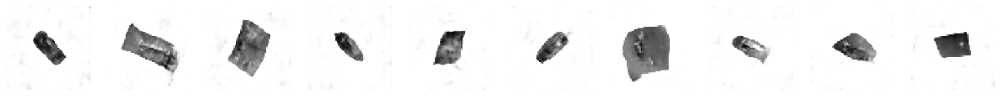

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.9581 - d_fake_acc: 0.9605 - d_loss: -0.3547 - d_real_acc: 0.9556 - g_acc: 0.0395 - g_loss: 10.5995
Epoch 51/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9866 - d_fake_acc: 0.9870 - d_loss: -0.5989 - d_real_acc: 0.9861 - g_acc: 0.0130 - g_loss: 13.1473
Saved to generated_img_050.png


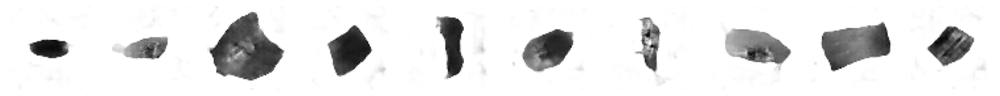


Saved to generated_img_050.png


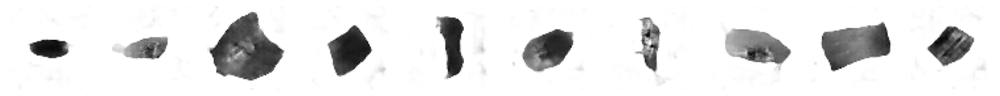

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9865 - d_fake_acc: 0.9870 - d_loss: -0.5985 - d_real_acc: 0.9861 - g_acc: 0.0130 - g_loss: 13.1448
Epoch 52/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9612 - d_fake_acc: 0.9620 - d_loss: -0.3786 - d_real_acc: 0.9605 - g_acc: 0.0380 - g_loss: 11.4405
Saved to generated_img_051.png


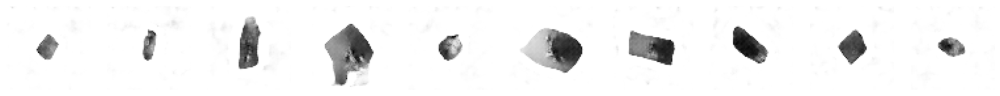


Saved to generated_img_051.png


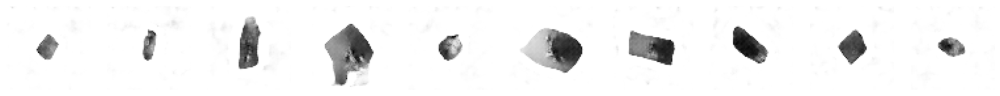

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9612 - d_fake_acc: 0.9619 - d_loss: -0.3781 - d_real_acc: 0.9604 - g_acc: 0.0381 - g_loss: 11.4373
Epoch 53/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9773 - d_fake_acc: 0.9776 - d_loss: -0.5345 - d_real_acc: 0.9769 - g_acc: 0.0224 - g_loss: 12.2730
Saved to generated_img_052.png


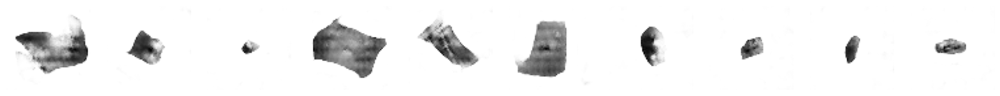


Saved to generated_img_052.png


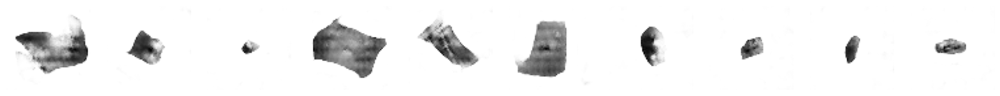

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9772 - d_fake_acc: 0.9776 - d_loss: -0.5343 - d_real_acc: 0.9768 - g_acc: 0.0224 - g_loss: 12.2749
Epoch 54/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9121 - d_fake_acc: 0.9264 - d_loss: 0.0930 - d_real_acc: 0.8979 - g_acc: 0.0736 - g_loss: 9.6747
Saved to generated_img_053.png


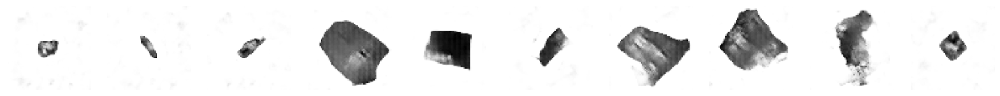


Saved to generated_img_053.png


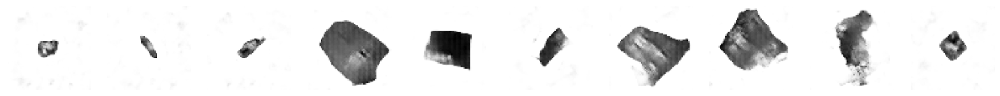

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9121 - d_fake_acc: 0.9265 - d_loss: 0.0936 - d_real_acc: 0.8978 - g_acc: 0.0735 - g_loss: 9.6788
Epoch 55/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9522 - d_fake_acc: 0.9559 - d_loss: -0.3267 - d_real_acc: 0.9485 - g_acc: 0.0441 - g_loss: 11.7001
Saved to generated_img_054.png


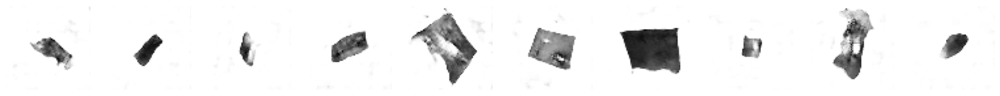


Saved to generated_img_054.png


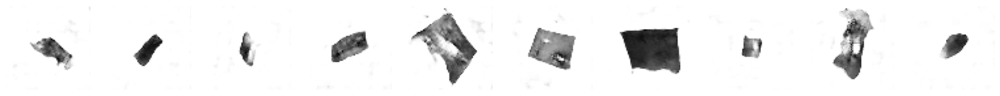

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9520 - d_fake_acc: 0.9558 - d_loss: -0.3249 - d_real_acc: 0.9483 - g_acc: 0.0442 - g_loss: 11.6976
Epoch 56/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9640 - d_fake_acc: 0.9652 - d_loss: -0.3768 - d_real_acc: 0.9628 - g_acc: 0.0348 - g_loss: 10.7414
Saved to generated_img_055.png


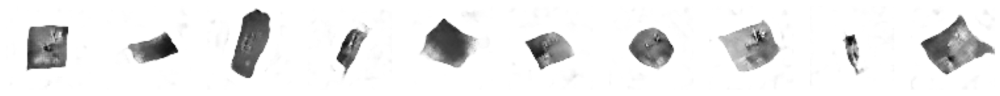


Saved to generated_img_055.png


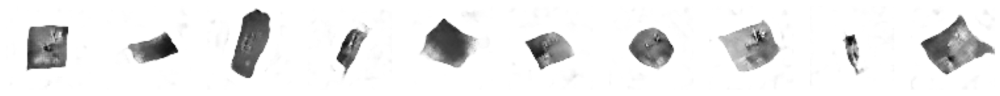

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9639 - d_fake_acc: 0.9652 - d_loss: -0.3765 - d_real_acc: 0.9627 - g_acc: 0.0348 - g_loss: 10.7414
Epoch 57/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9962 - d_fake_acc: 0.9962 - d_loss: -0.7025 - d_real_acc: 0.9962 - g_acc: 0.0038 - g_loss: 14.6006
Saved to generated_img_056.png


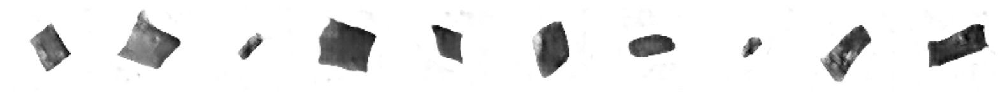


Saved to generated_img_056.png


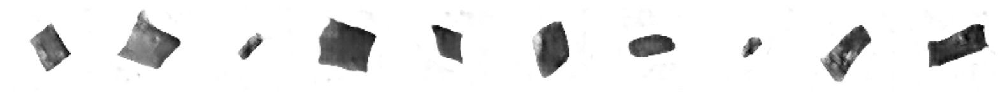

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9961 - d_fake_acc: 0.9962 - d_loss: -0.7015 - d_real_acc: 0.9961 - g_acc: 0.0038 - g_loss: 14.6008
Epoch 58/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.9198 - d_fake_acc: 0.9173 - d_loss: -0.0724 - d_real_acc: 0.9223 - g_acc: 0.0827 - g_loss: 9.5820
Saved to generated_img_057.png


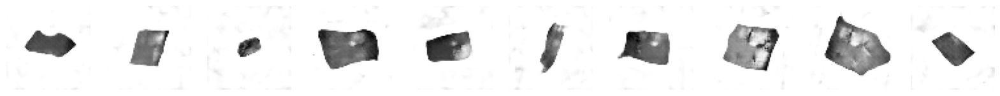


Saved to generated_img_057.png


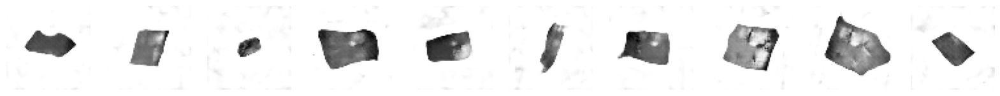

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.9200 - d_fake_acc: 0.9175 - d_loss: -0.0735 - d_real_acc: 0.9224 - g_acc: 0.0825 - g_loss: 9.5867
Epoch 59/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9612 - d_fake_acc: 0.9602 - d_loss: -0.3740 - d_real_acc: 0.9622 - g_acc: 0.0398 - g_loss: 10.5199
Saved to generated_img_058.png


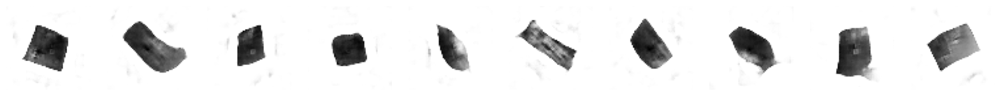


Saved to generated_img_058.png


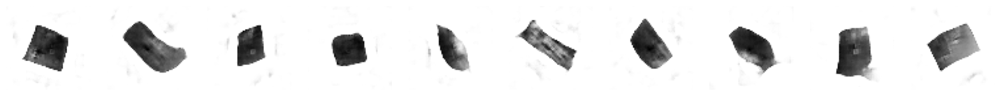

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9611 - d_fake_acc: 0.9602 - d_loss: -0.3739 - d_real_acc: 0.9621 - g_acc: 0.0398 - g_loss: 10.5226
Epoch 60/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9721 - d_fake_acc: 0.9706 - d_loss: -0.4634 - d_real_acc: 0.9737 - g_acc: 0.0294 - g_loss: 11.8387
Saved to generated_img_059.png


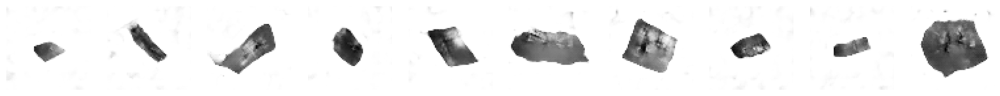


Saved to generated_img_059.png


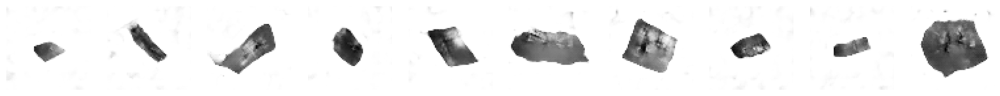

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.9721 - d_fake_acc: 0.9706 - d_loss: -0.4634 - d_real_acc: 0.9737 - g_acc: 0.0294 - g_loss: 11.8394
Epoch 61/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.9977 - d_fake_acc: 0.9971 - d_loss: -0.7432 - d_real_acc: 0.9982 - g_acc: 0.0029 - g_loss: 14.9846
Saved to generated_img_060.png


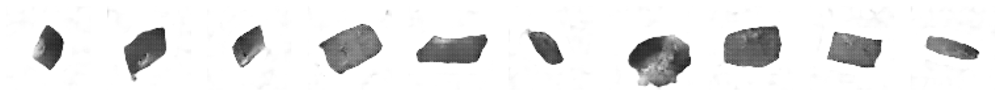


Saved to generated_img_060.png


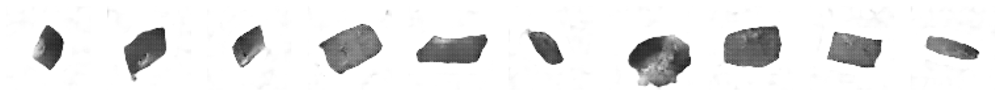

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9977 - d_fake_acc: 0.9972 - d_loss: -0.7434 - d_real_acc: 0.9982 - g_acc: 0.0028 - g_loss: 14.9884
Epoch 62/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.7987 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.0971
Saved to generated_img_061.png


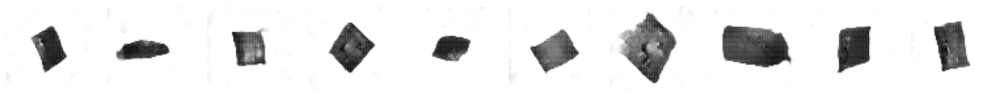


Saved to generated_img_061.png


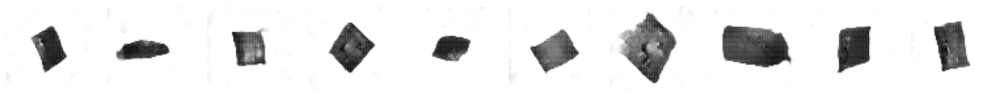

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.7987 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.0972
Epoch 63/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.8045 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1179
Saved to generated_img_062.png


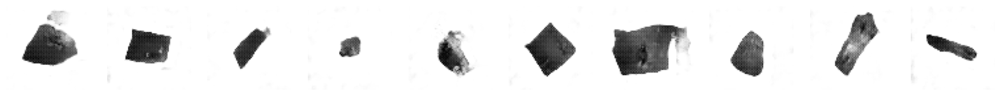


Saved to generated_img_062.png


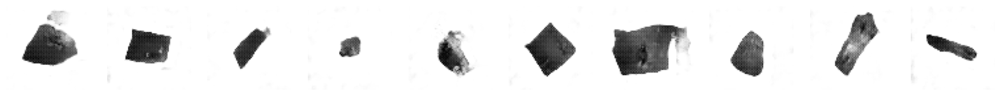

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.8045 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1179
Epoch 64/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.8045 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1175
Saved to generated_img_063.png


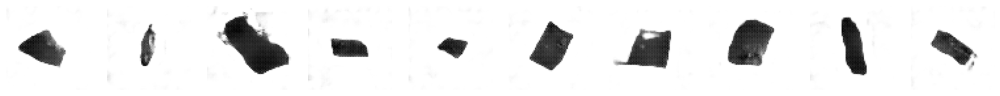


Saved to generated_img_063.png


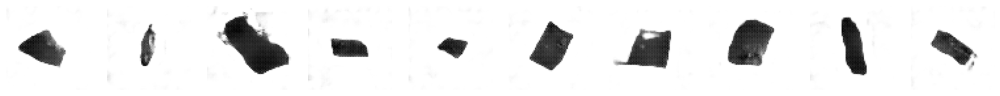

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.8045 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1175
Epoch 65/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.7998 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1163
Saved to generated_img_064.png


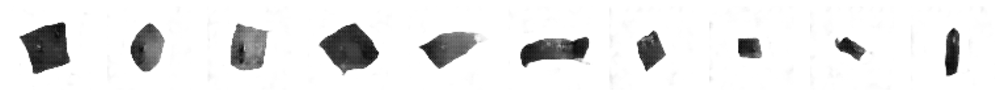


Saved to generated_img_064.png


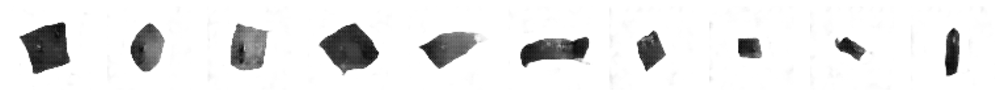

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 1.0000 - d_fake_acc: 1.0000 - d_loss: -0.7998 - d_real_acc: 1.0000 - g_acc: 0.0000e+00 - g_loss: 16.1163
Epoch 66/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.9412 - d_fake_acc: 0.8843 - d_loss: 0.2178 - d_real_acc: 0.9981 - g_acc: 0.1157 - g_loss: 14.2218
Saved to generated_img_065.png


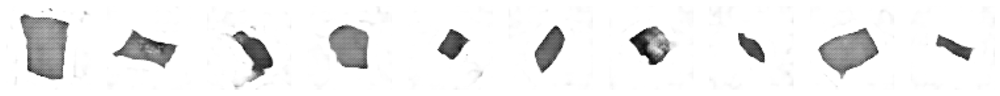


Saved to generated_img_065.png


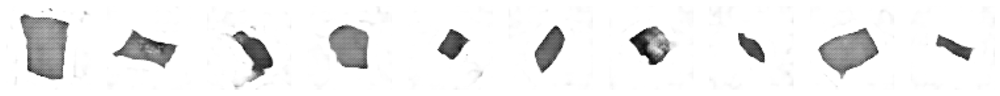

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.9403 - d_fake_acc: 0.8826 - d_loss: 0.2335 - d_real_acc: 0.9981 - g_acc: 0.1174 - g_loss: 14.1929
Epoch 67/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9718 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_066.png


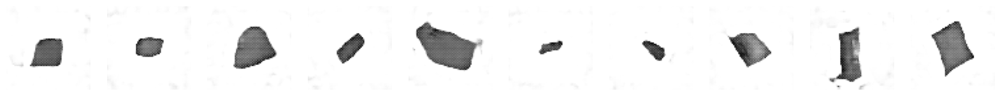


Saved to generated_img_066.png


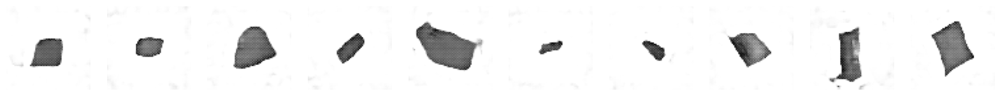

363/363 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9718 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 68/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9712 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_067.png


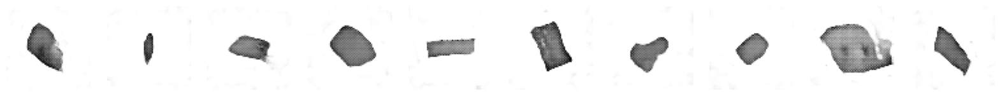


Saved to generated_img_067.png


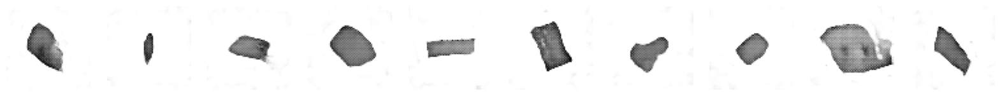

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9712 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 69/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9730 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_068.png


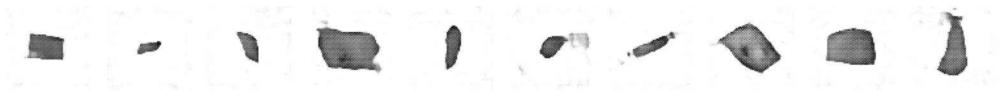


Saved to generated_img_068.png


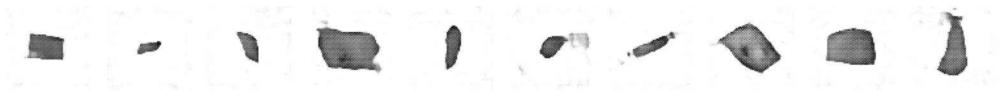

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9730 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 70/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9725 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_069.png


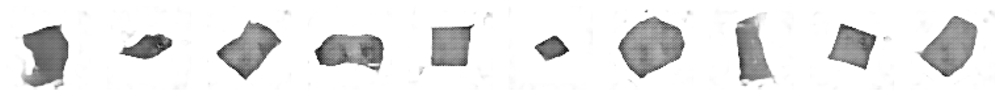


Saved to generated_img_069.png


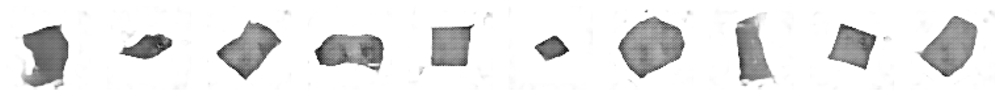

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9725 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 71/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9731 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_070.png


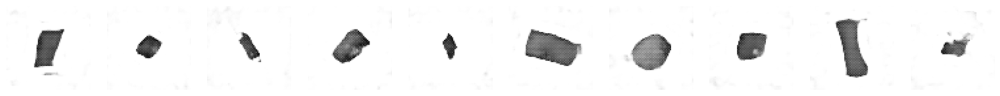


Saved to generated_img_070.png


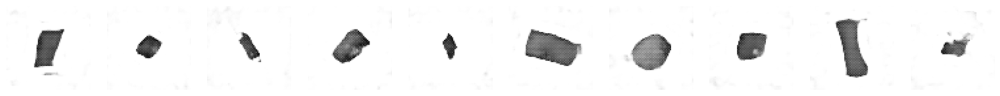

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9731 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 72/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9744 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_071.png


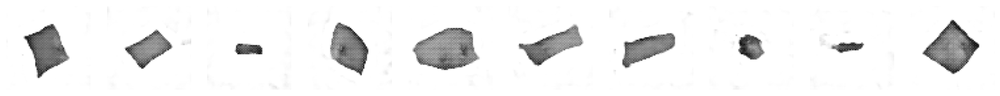


Saved to generated_img_071.png


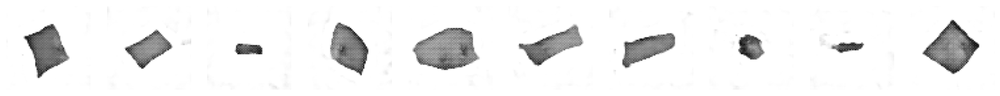

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9744 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 73/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9672 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_072.png


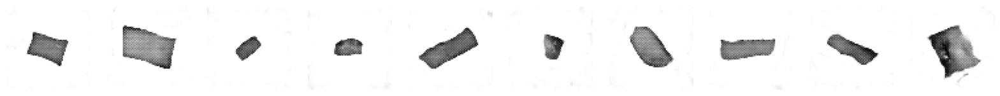


Saved to generated_img_072.png


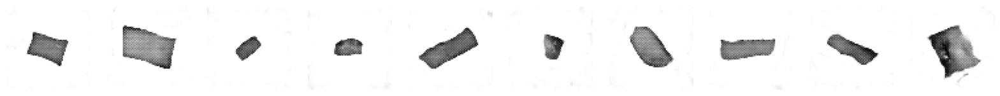

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9672 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 74/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9709 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_073.png


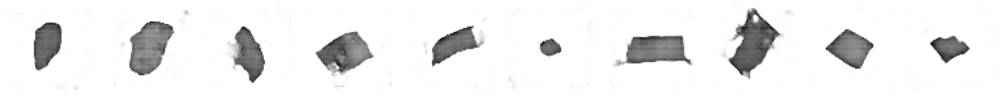


Saved to generated_img_073.png


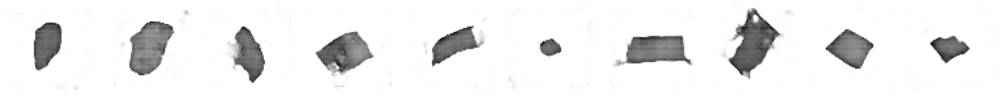

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9709 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 75/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9729 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_074.png


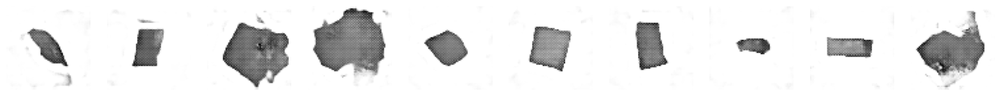


Saved to generated_img_074.png


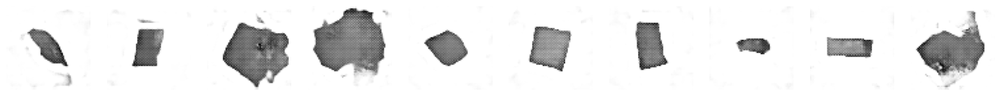

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9729 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 76/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9748 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_075.png


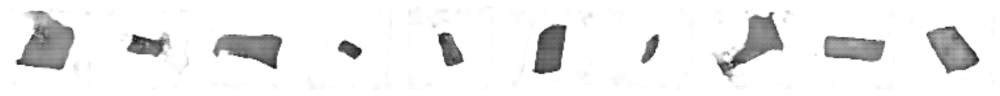


Saved to generated_img_075.png


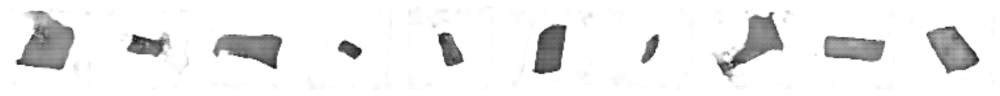

363/363 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9748 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 77/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9707 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_076.png


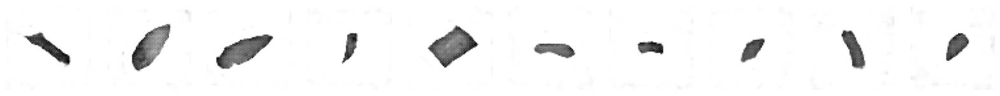


Saved to generated_img_076.png


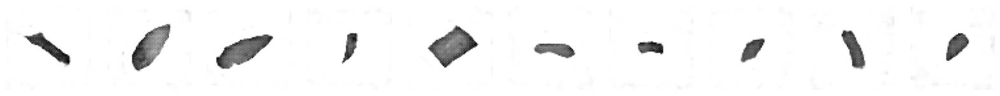

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9707 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 78/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9759 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_077.png


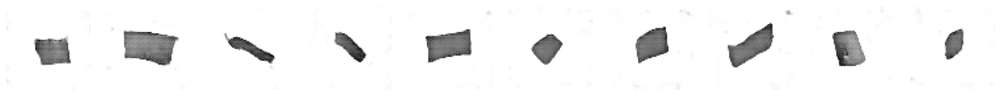


Saved to generated_img_077.png


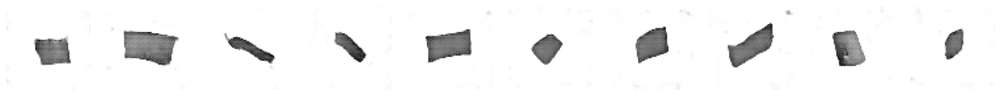

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9758 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 79/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9715 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_078.png


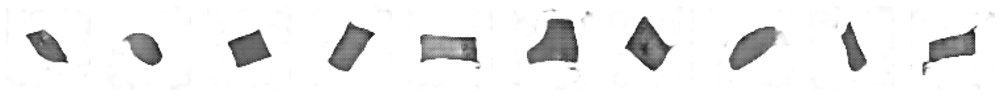


Saved to generated_img_078.png


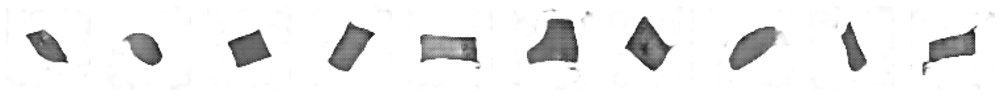

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9715 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 80/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9710 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_079.png


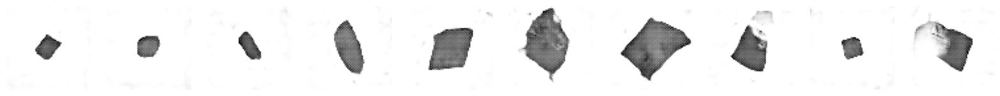


Saved to generated_img_079.png


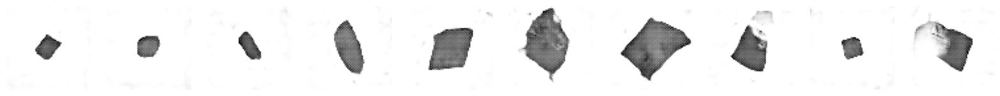

363/363 ━━━━━━━━━━━━━━━━━━━━ 82s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9710 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 81/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_080.png


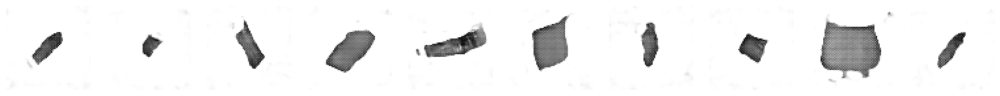


Saved to generated_img_080.png


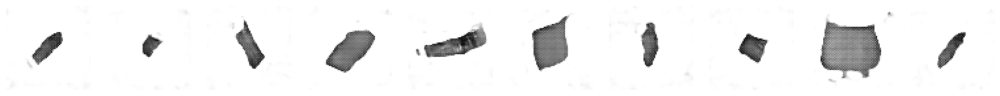

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 82/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9712 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_081.png


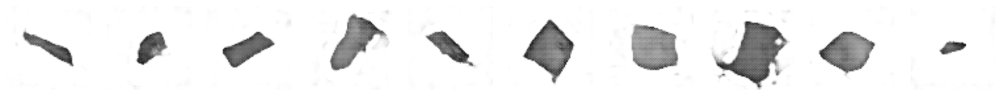


Saved to generated_img_081.png


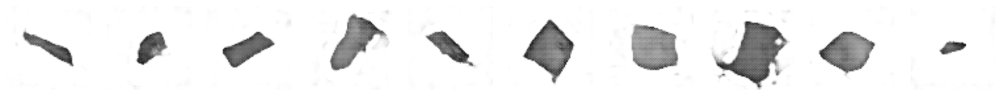

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9712 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 83/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9713 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_082.png


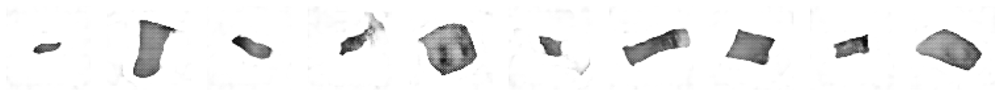


Saved to generated_img_082.png


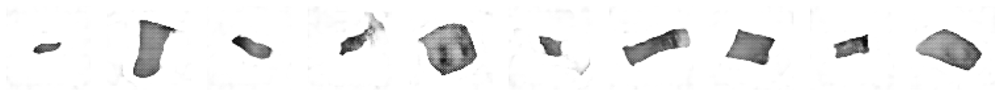

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9713 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 84/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9687 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_083.png


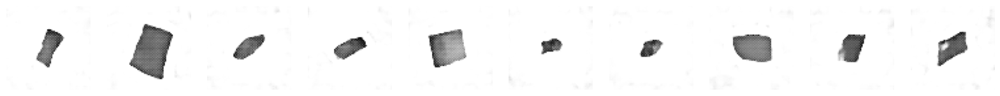


Saved to generated_img_083.png


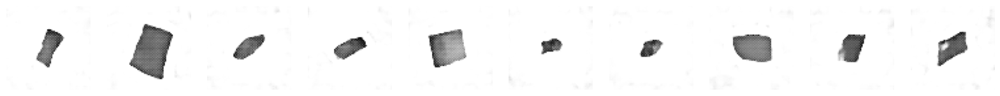

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9687 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 85/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_084.png


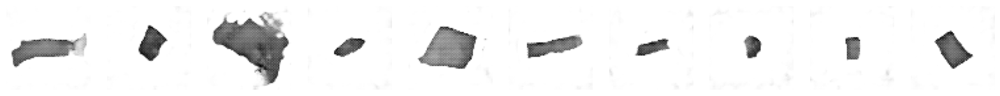


Saved to generated_img_084.png


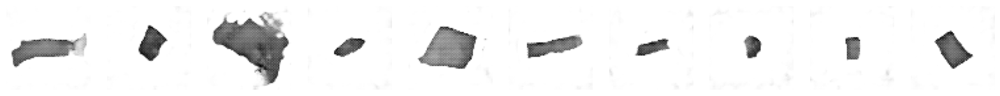

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 86/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9694 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_085.png


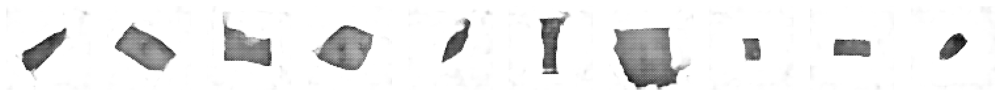


Saved to generated_img_085.png


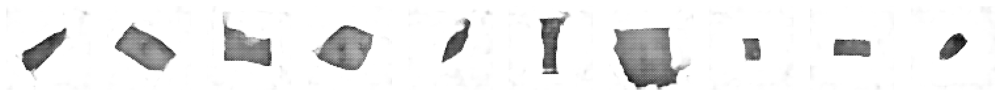

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9694 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 87/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9658 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_086.png


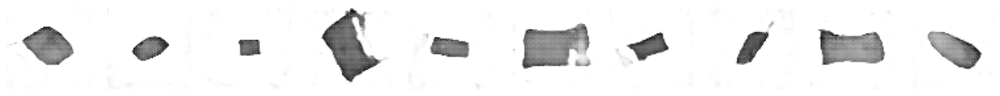


Saved to generated_img_086.png


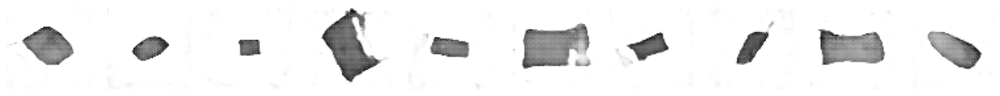

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9658 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 88/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9716 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_087.png


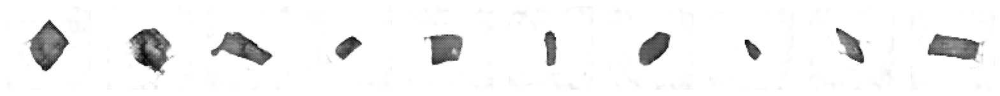


Saved to generated_img_087.png


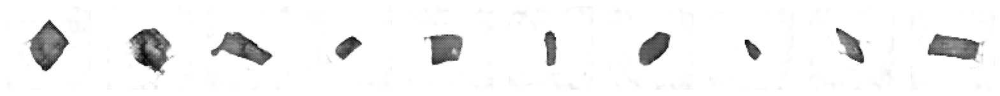

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9716 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 89/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9733 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_088.png


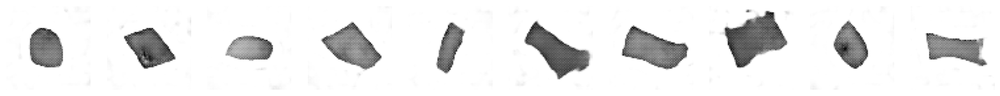


Saved to generated_img_088.png


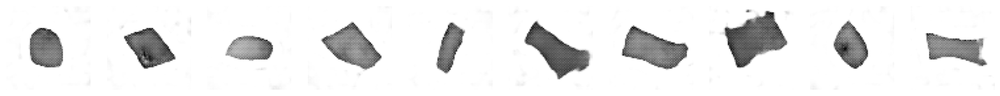

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9733 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 90/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9737 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_089.png


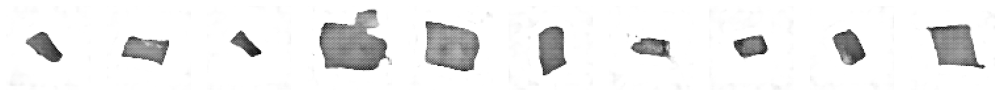


Saved to generated_img_089.png


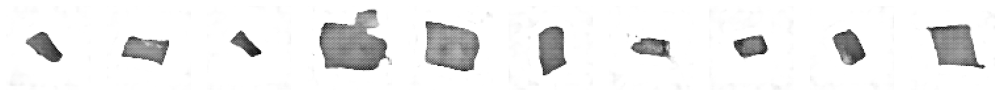

363/363 ━━━━━━━━━━━━━━━━━━━━ 43s 117ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9737 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 91/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9722 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_090.png


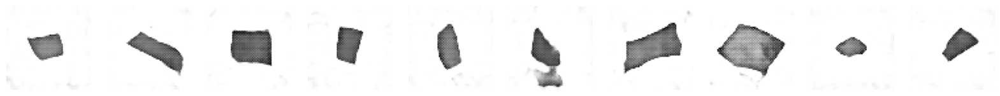


Saved to generated_img_090.png


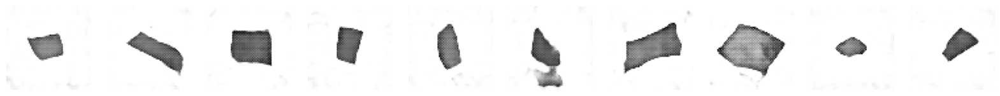

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9722 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 92/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9689 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_091.png


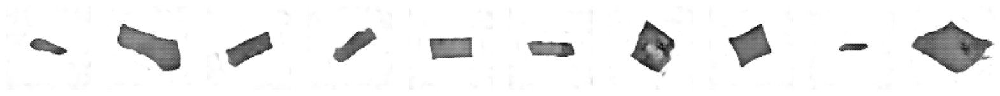


Saved to generated_img_091.png


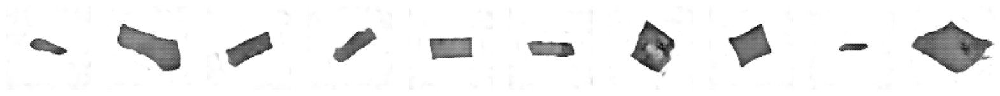

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9689 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 93/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9684 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_092.png


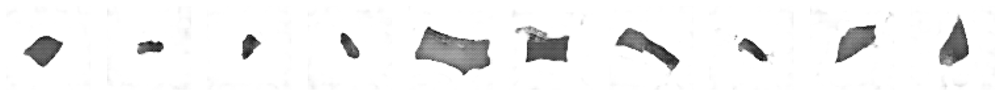


Saved to generated_img_092.png


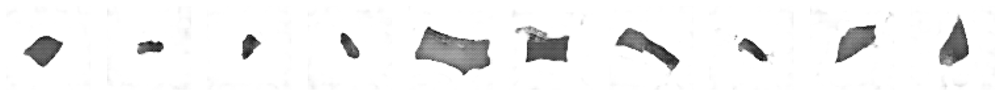

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9684 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 94/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9701 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_093.png


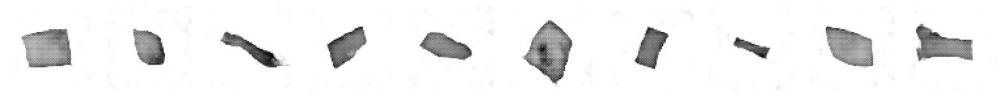


Saved to generated_img_093.png


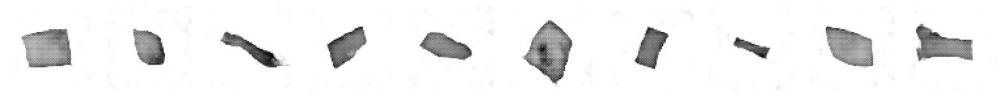

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9701 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 95/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_094.png


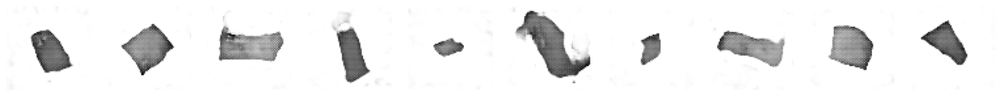


Saved to generated_img_094.png


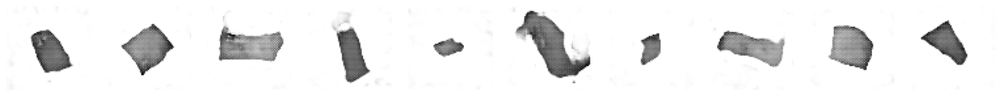

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9702 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 96/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9729 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_095.png


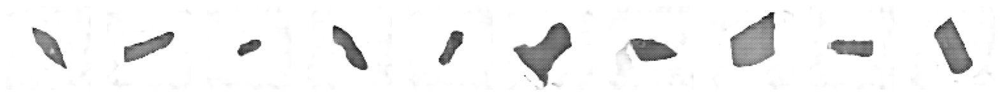


Saved to generated_img_095.png


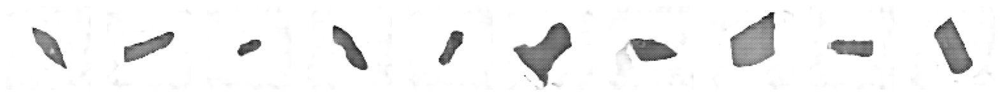

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9729 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 97/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9684 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_096.png


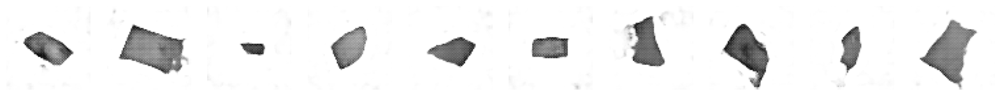


Saved to generated_img_096.png


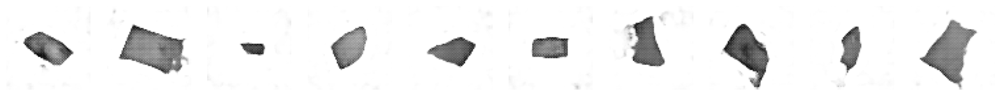

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9684 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 98/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9685 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_097.png


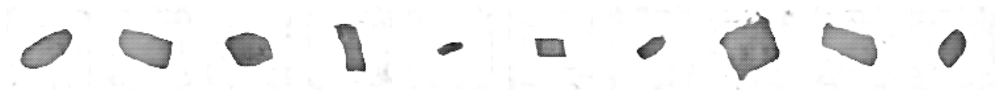


Saved to generated_img_097.png


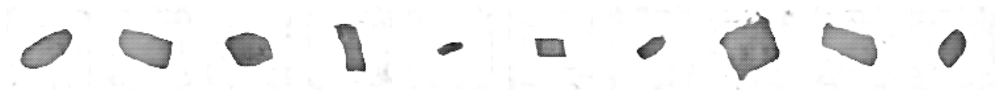

363/363 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9685 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 99/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9748 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_098.png


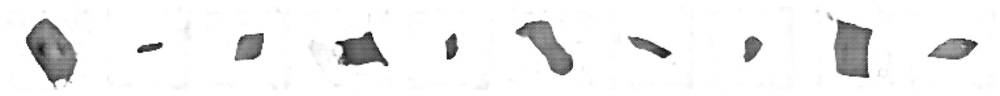


Saved to generated_img_098.png


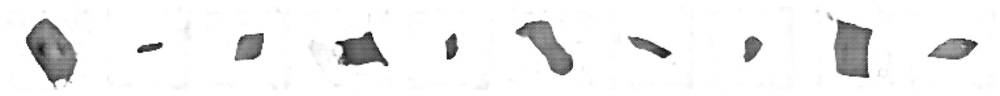

363/363 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9748 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Epoch 100/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9700 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07
Saved to generated_img_099.png


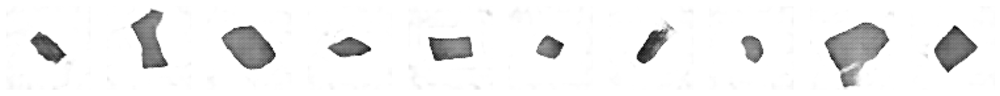


Saved to generated_img_099.png


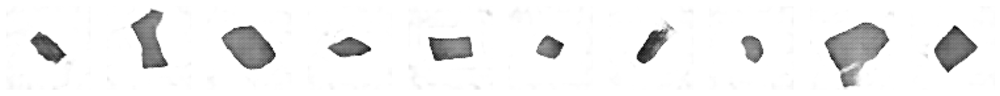

363/363 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - d_acc: 0.5000 - d_fake_acc: 0.0000e+00 - d_loss: 7.9700 - d_real_acc: 1.0000 - g_acc: 1.0000 - g_loss: 1.1921e-07


In [42]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [44]:
!mkdir models

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [45]:
# Save the final models
generator.save("./models/generator.keras")
discriminator.save("./models/discriminator.keras")

## 3. Generate new images <a name="decode"></a>

In [46]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [47]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


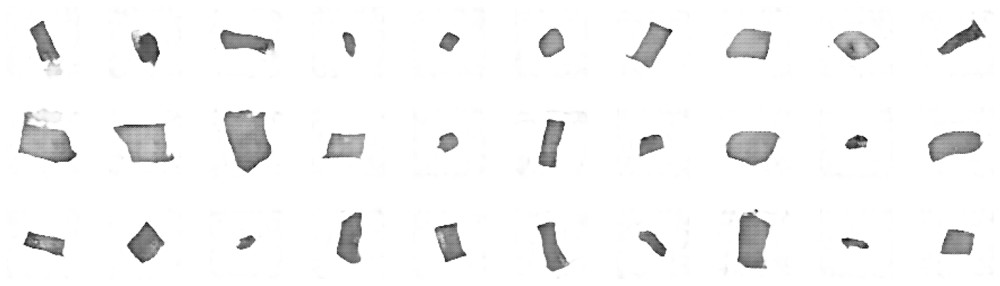

In [48]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [49]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [50]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


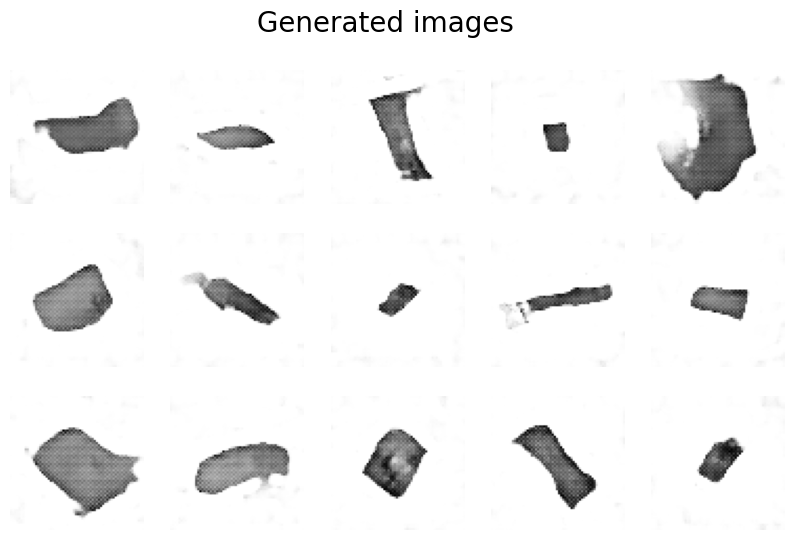

In [51]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

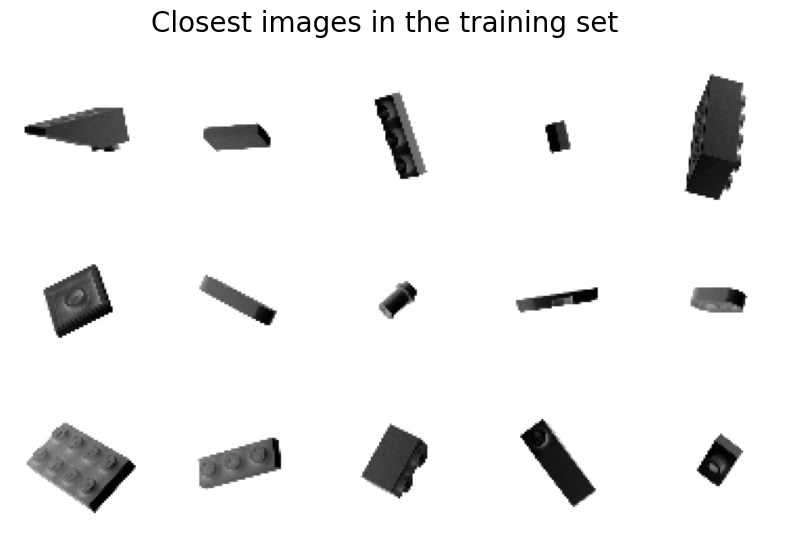

In [52]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()